    Author: Anastasios (Andy) Tzanidakis
    Prof. Melissa Ness
    Modern Stellar Astrophysics - HW 1
    September 25, 2018
    
<div class="alert alert-success">
 For an interactive version of this notebook, please view this in [Nbviewer](https://nbviewer.jupyter.org/github/AndyTza/modern_astro/blob/master/Modern%20Stellar%20Astrophysics%20Homework%201%20Solutions.ipynb)
</div>

In [468]:
import matplotlib.pyplot as plt 
from astropy.io import ascii
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
from bokeh.plotting import figure 
from bokeh.io import output_notebook, show
output_notebook()

Loading BokehJS ...

## __Problem 1__



## Query restrictions dowloading the data from ADQL:
 From __Problem 1__ here are the following filters we must apply before querying the data:
 - We __SELECT TOP (100,000)__ sources from Gaiadr2.gaia_source
 - Parallax > 0 (Utilizing only positive parallaxes)
 - Parallax errors < 10 percent (i.e parallax_over_error > 10)
 
    In SQL Query Form: 
        
        SELECT TOP 100000
        parallax, parallax_over_error, phot_g_mean_mag, phot_bp_mean_mag, phot_rp_mean_mag
        FROM gaiadr2.gaia_source 
        WHERE parallax > 0 
        AND parallax_over_error > 10 
 

Once the data is obtained, we now __roughly__ estimate the absolute magnitude ($M_{G}$) for our sources given that we have reliable parllaxes ($\omega$[mas]) where we invert the parallax to obtain distance ($d$ [pc]): 


\begin{equation*}
M_G = G - 5log_{10}{\Bigl({\frac{d}{10}}\Bigr)}
\end{equation*}  

 

In [7]:
# load data 
data = ascii.read("/Users/iraf1/Downloads/1537317034776O-result.csv")

# Assigng variables: 
chi = data['astrometric_chi2_al'] # chi-2 metric of fit

# Define variables for analysis 
parallax = data['parallax'] * 0.001 # convert paralalx to arcseconds
distance = 1/parallax # distance in (pc)
g = data['phot_g_mean_mag']
bp_rp = data['phot_bp_mean_mag'] - data['phot_rp_mean_mag'] 

# Define distance cuts 
d_near = distance<100 # less than 100 pc 
d_far = np.where((distance>2000) & (distance<3000)) # between 2kpc - 3kpc 

# Apply distance modulus to estimate absolute magnitude
Mg_near = g[d_near] - 5*np.log10(distance[d_near]/10) # near cut (<100 pc)
Mg_far = g[d_far] - 5*np.log10(distance[d_far]/10) # far cut (2-3 kpc)
Mg = g - 5*np.log10(distance/10) # all sources


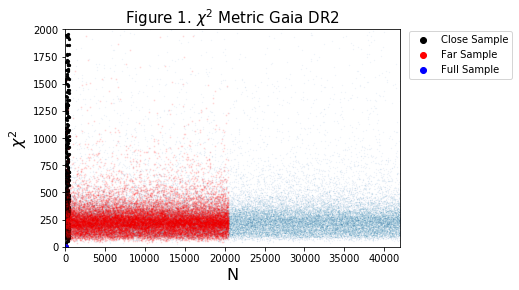

In [319]:
plt.scatter(np.arange(0,len(chi),step=1),chi, s=0.1, alpha=0.1, label='')
plt.scatter(np.arange(0,len(chi[d_near]),step=1),chi[d_near], s=5, color='k', label='')
plt.scatter(np.arange(0,len(chi[d_far]),step=1),chi[d_far], s=1, color='red', alpha=0.09, label='')
plt.scatter(-1,-1, color='k', label='Close Sample')
plt.scatter(-1,-1, color='red', label='Far Sample')
plt.scatter(-1,-1, color='blue', label='Full Sample')
plt.ylim(0,2000)
plt.ylabel('$\chi^{2}$', size=16)
plt.xlabel('N', size=16)
plt.xlim(-10,42000)
plt.title('Figure 1. $\chi^{2}$ Metric Gaia DR2', size = 15)
plt.legend(bbox_to_anchor=[1.18,0.75])

Text(0.5,1,'Figure 2. Binned Histogram of Distances with Distance Cuts')

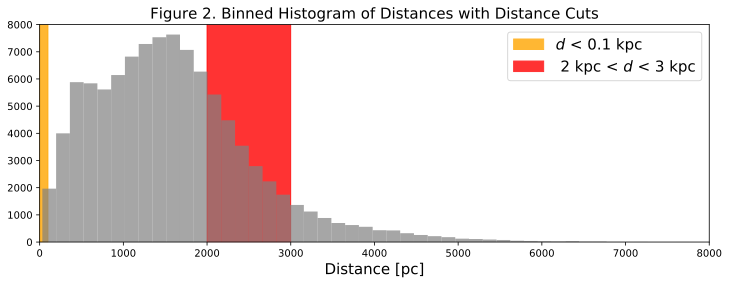

In [469]:
_, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4))
ax.fill_between(np.arange(0,100,step=1),9900, 0, label='$d$ < 0.1 kpc', color='orange',
               alpha=0.8)
ax.fill_between(np.arange(2000,3000,step=1),9900, 0, label=' 2 kpc < $d$ < 3 kpc',
                color='red', alpha=0.8)
ax.set_xlim(0,8000)
ax.set_ylim(0,8000)
ax.hist(distance, bins=50, color='gray', alpha=0.7, label='')
ax.legend(fontsize=15)
ax.set_xlabel('Distance [pc]', size=15)
ax.set_title('Figure 2. Binned Histogram of Distances with Distance Cuts', size=15)

/Users/iraf1/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


Text(0.5,1,'Figure 3. Number Density HR Diagram Sample N=100,000')

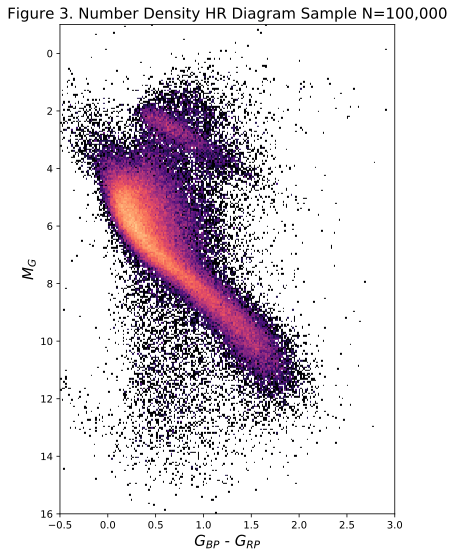

In [471]:
# bins 
b_x = np.linspace(np.min(bp_rp), np.max(bp_rp), num=300)
b_y = np.linspace(np.min(Mg), np.max(Mg), num=300)
# Histogram 
H = np.histogram2d(Mg, bp_rp, bins=(b_y, b_x))

_, ax = plt.subplots(ncols=1, nrows=1, figsize=(6, 9))

ax.imshow(np.log(H[0]), vmin=0, vmax=5, cmap='magma', origin='lower', extent=[-1, 4,-1, 16 ], aspect='auto')
ax.set_ylim(plt.ylim()[::-1])
ax.set_xlim(-0.5,3)
ax.set_xlabel('$G_{BP}$ - $G_{RP}$', size=15)
ax.set_ylabel('$M_{G}$', size=15)
ax.set_title('Figure 3. Number Density HR Diagram Sample N=100,000', size=15)

In [473]:
_, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,7))

ax.scatter(bp_rp, Mg, s=1.9, color='k', alpha=0.1, label='Full Sample')
ax.scatter(bp_rp[d_near], Mg_near, s=10, alpha=0.7, color='blue', label='<100pc')
ax.scatter(bp_rp[d_far], Mg_far, s=0.1, alpha=0.7, color='red', label='2-3 kpc')
ax.set_ylim(ax.set_ylim()[::-1])
ax.set_xlim(-1, 4)
ax.set_xlabel('$G_{BP}$ - $G_{RP}$', size=15)
ax.set_ylabel('$M_{G}$', size=15)
ax.set_title('Figure 4. HR Diagram Comparison with Distance Cuts', size=15)
plt.legend(bbox_to_anchor=[1,0.85])

Demonstrated in __Fig 4.__, the full sample of downloaded stars with parallax constrain <10% parallax error, will display an HR diagram with distinct and key features of the HRD such as the Main Sequence (MS) and Giant Branch (GB) -- also shown in __Figure 3.__ It is immediatelly noticed in __Fig. 4__ with the red scatter of stars between 2-3 kpc distance cuts are found on the higher-mass and temperature range of the MS and some even extend to the GB. As expected, these stars due to their high mass and luminosity values and in result accurate parallax measurements due to good S/N, fit the constraining parallax parameters we've requested.  

Curiously, however, the closer <100pc distance cut returns stars that are less luminous, and clearly do not fall on any key features of the MS. While this doesn't suggest that the solar neighborhood contains less luminous stars, however, it can be demonstrated that the closer selected sample size has several flaws that may be causing it do not overlap with other features. In __Fig, 1__ we display the $\chi^{2}$ -- the astrometric fit for each source as reported from [GaiaDR2](https://gea.esac.esa.int/archive/documentation/GDR2/Gaia_archive/chap_datamodel/sec_dm_main_tables/ssec_dm_gaia_source.html#gaia_source-astrometric_chi2_al) as a function of frequency. Interestingly, the closer sample (<100pc -- shown in black) seems to have excessive amounts $\chi^{2}$ versus the __mean__ which is seen in the main density where most stars in the full sample lay. This is nicely shown for the 2-3kpc distance cut, as the red scatter have levels of $\chi^{2}$ consistent with the full sample. 


Last, it is noted that due to the query restrictions given, that the sample size does not contain enough of stars in order to begin to display the overlap of structure in the HRD with closer smaples. Indeed, this is shown in __Fig. 2__ where it clealy demonstrated: 


\begin{equation*}
N_{far} > N_{close}
\end{equation*}


The area difference of the distance cuts suggested differ by a number magnitude ~10, thus yielding to a much higer sample for stars that were distant rather than close. One way to work around this would be to suggest a much higher initial sample size in order to identify all nearby sources. 


# Problem 2 



   __Part (a): __

   We can utilize the distance luminosity function for a given star with Luminosity (L), distance (R) and Flux (F)

\begin{equation*}
L = \frac{F}{4\pi R^2}
\end{equation*}


   Further, we're also able to relate the Flux of a source by its temeprature using Stefan-Boltzman relation: 

\begin{equation*}
F = \sigma T^4
\end{equation*}


   Given two stars with 
$${(L_1, R_1, T_1)}$$ 
    
$${(L_2, R_2, T_2)}$$

   Their definig relationships can be expressed as following : 


\begin{equation*}
\frac{L_1}{L_2} = \frac{F_1}{4\pi R_{1}^2} \frac{4\pi R_{2}^2}{F_2}
\end{equation*}

   By simiplifying terms we conclude: 
\begin{equation*}
\frac{L_1}{L_2}={\Bigl({\frac{T_1}{T_2}}\Bigr)}^4 {\Bigl({\frac{R_1}{R_2}}\Bigr)}^2 
\end{equation*}
        

   __Part (b):__
    
   We can now derive an approximate radius estimate for Betelgeuse. Given T=3370K and L=72100 Lsolar:
    
\begin{equation*}
\frac{L_B}{L_\odot}={\Bigl({\frac{T_B}{T_\odot}}\Bigr)}^4 {\Bigl({\frac{R_B}{R_\odot}}\Bigr)}^2 
\end{equation*}    
    
   We can now numerically estimate the approximate value of betelgeuse:
    
    
\begin{equation*}
R_B = {\Bigl({\frac{72100*R_\odot^{2}*T_\odot^{4}}{T_B^{4}}}\Bigr)}^{\frac{1}{2}}
\end{equation*}   

Which yields to an estimate of 



\begin{equation*}
R_B = 778 R_\odot
\end{equation*} 



## __ Problem 3__: 

__ Part (a): __


For a log, log plot, we are able to re-arange the Mass (M) and Luminiosity (L) terms:

\begin{equation*}
(X, Y) = log{\Bigl({\frac{M}{M_{\odot}}}\Bigr)},     log{\Bigl({\frac{L}{L{\odot}}}\Bigr)}
\end{equation*} 


\begin{equation*}
log_{10}{\Bigl({\frac{0.1*M_{\odot}}{M_{\odot}}}\Bigr)} = -1
\end{equation*} 

\begin{equation*}
log_{10}{\Bigl({\frac{1*M_{\odot}}{M_{\odot}}}\Bigr)} = 0
\end{equation*} 

\begin{equation*}
log_{10}{\Bigl({\frac{10*M_{\odot}}{M_{\odot}}}\Bigr)} = 1
\end{equation*} 

\begin{equation*}
log_{10}{\Bigl({\frac{30*M_{\odot}}{M_{\odot}}}\Bigr)} = 1.4
\end{equation*} 

\begin{equation*}
log_{10}{\Bigl({\frac{100*M_{\odot}}{M_{\odot}}}\Bigr)} = 2
\end{equation*} 


Thus for each corresponding mass that we find, we can also extrapolate the luminosity by applying the general exponential form: 

\begin{equation*}
L = 10^{Y} * L\odot
\end{equation*} 

For each corresponding mass, we now compute the luminosity at each point: 

\begin{equation*}
L = [ {10^{-3}}L_{\odot}, 1L_{\odot}, 10^{4}L_{\odot}, 10^{5}L_{\odot}, 10^{7}L_{\odot} ]
\end{equation*} 



__Part (b): __ 

For our given mass and luminosity data points we apply equation


\begin{equation*}
\tau_{MS} = \frac{Q}{4}* f * \frac{M}{m_{H}} * L^{-1}
\end{equation*}

Where we express the units of Q and L in __Joules__ and __Joules/seconds__, and masses in __kilograms__. We estimate for the given mass and luminosity of each extrapolated point: 

\begin{equation*}
\tau_{MS} = [1.47 x 10^3, 2.94, 1.47x10^{-2}, 4.41 x 10^{-3},
       1.47 x 10^{-4}]  Gyr
\end{equation*}


__Part (c): __ 

The main difference between low and high mass stars is in life-time on the Main Sequence. As shown in __Fig.5__, we conclude that __high__ mass stars will remain on the MS for a shorter time versus the low mass stars. In fact, our rough estimations suggest that very low mass stars can exceed the age of the universe.

In [474]:
# Data-points obtained by Figure 1 from HW #1
M_data = np.array([0.1, 1, 10, 30, 100]) # times solar mass
L_data = np.array([0.001, 1, 10**4, 10**5, 10**7]) # times solar luminosity 

def luma(mass, units='Joules'):
    """Esimation of luminosity of a given star for a given mass in the Main Sequence.
    
       Parameters
       ----------
       mass: Mass of star in solar units (float)
       units: return units in either Solar or Joules/second (str)
    """
    if units=='Joules':
        L = (mass)**(3.5) * (3.848*10**26) # J/s
    elif units=='Solar': 
        L = (mass)**(3.5) # Solar units
    
    return L

def t_ms(mass, luminosity, f=0.15, q_factor=1.001e-12, m_h=1.674e-27, time_units='mega'): 
    "Return the life-time of main-sequence star for given f, Q factors"
    
    if time_units=='mega':
        time = (q_factor*f*mass*1.99e30)/(m_h*luminosity*3.848e26) # sec
        time = time * 3.171e-14 #Myr 
    elif time_units=='giga':
        time = (q_factor*f*mass*1.99e30)/(m_h*luminosity*3.848e26) # sec
        time = time * 3.171e-17 #Gyr 
        
    return time    

# Create mock mass and luminosity for distribution
M_mock = np.linspace(0.1, 100, num=230)
L_mock = luma(M_mock, units='Solar')

time_mock = t_ms(M_mock, L_mock, time_units='giga')
time_data = t_ms(M_data, L_data, time_units='giga' )

## Figure 5

In [475]:
# Interactive plot
p = figure(width=700, height=400, x_axis_label='M/M⊙', y_axis_label='time [Gyr]',
          title='Figure 5. Mass-time functions of extrapolated data')

# Life-time MS for a distribution
p.circle_cross(M_mock,time_mock, color="red", size=10, alpha=0.05) 
p.cross(M_data, time_data, color="black", size=20, alpha=1) 
show(p)

## Problem 4

__Part (a)__ : 

We're able to extrapolate the effective temperature $(T_{eff})$ from [Table 1](http://www.astro.caltech.edu/~george/ay20/eaa-stellarmasses.pdf) for given mass: 

\begin{equation*}
M = [0.1, 1, 10, 30] M_{\odot}
\end{equation*} 

\begin{equation*}
T_{eff} = [2900K, 5800K, 27000K, 39000K]
\end{equation*} 

Finally, from __problem 3a__, we can use the luminosities: 

\begin{equation*}
L = [ {10^{-3}}L_{\odot}, 1L_{\odot}, 10^{4}L_{\odot}, 10^{5}L_{\odot}, 10^{7}L_{\odot} ]
\end{equation*} 

and apply it to the following relationship (derived from problem 2):


\begin{equation*}
R_{*} = \sqrt{ \frac{L_{*}}{L_{\odot}} \frac{T^{4}_{\odot}}{T^4_{*}}} R_{\odot}
\end{equation*} 


\begin{equation*}
R_{*} = [0.12R_{\odot}, 1R_{\odot}, 4.61R_{\odot}, 6.99R_{\odot}]
\end{equation*} 



__Part (b)__ : 

The average solar density ($\rho_{\odot}$) could be describe as: 

\begin{equation*}
\bar{\rho_{\odot}} = \frac{3M_{\odot}}{4\pi R^{3}_{\odot}}
\end{equation*} 

For a particular star, we can express the denisty in terms of solar denisty: 

\begin{equation*}
\rho_{*} = \frac{M_{*}}{M_{\odot}} \frac{R^{3}_{\odot}}{R^{3}_{*}}\rho_{\odot}
\end{equation*} 

Thus, we can estimate the density for each given radii and mass: 

\begin{equation*}
\rho_{*} = [49.4\rho_{\odot},1\rho_{\odot},  0.102\rho_{\odot},  0.088\rho_{\odot}] 
\end{equation*} 


__ Part (c)__ : 

Here we can estimate the average temperature of a star from the following relationship: 

\begin{equation*}
\bar{T} = 4*10^6 \frac{M}{M_{\odot}} \frac{R_{\odot}}{R} Kelvin
\end{equation*} 

\begin{equation*}
\bar{T} = [3162277 K ,  4000000 K,  8668252 K, 17157518 K]
\end{equation*} 

As shown in __Fig.6__, the temperature of a star as a function of radius, the __average temperature__ will have a much higher themral profile versus the effective temperature. One might expect this to be true since the average temperature takes into consideration the total thermal radiation of the star, while the effective temperature is essentially a derived measurement based on the flux (brightness) profile of each star -- thus yielding to much smaller values.


__Part (d)__: 
We use the [following review by H. Lamers and E. Levesque](http://iopscience.iop.org/chapter/978-0-7503-1278-3/bk978-0-7503-1278-3ch4.pdf) to determine roughly if our data could be considered ideal gases or not. As suggested from __Fig. 7__ indeed all of our sources are in the ideal gas region. 

Text(0.5,1,'Figure 6. Temeperature Profile as a Function of Radius')

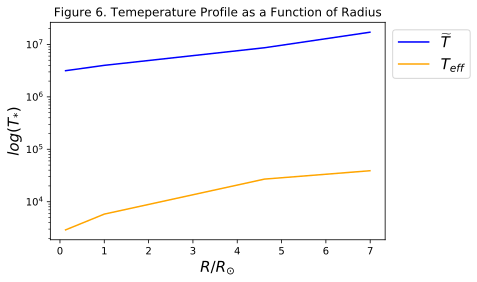

In [481]:
plt.plot(RAD,AVET, label= "$\widetilde{T}$", color='blue')
#plt.errorbar(RAD, AVET, yerr=se, capsize=5)
plt.plot(RAD,teff_data, label='$T_{eff}$', color='orange')
#plt.errorbar(RAD, teff_data, yerr=ce, capsize=5)
plt.legend(bbox_to_anchor=[1,1],fontsize=15)
plt.yscale('log')
plt.xlabel('$R/R_{\odot}$', size=15)
plt.ylabel('$log(T_{*})$', size=15)
plt.title('Figure 6. Temeperature Profile as a Function of Radius')


Text(0.5,1,'Figure 7. Log Temperature Density Relation ')

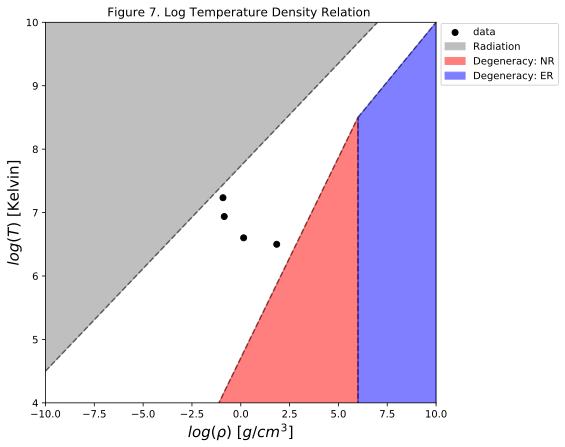

In [480]:
plt.figure(figsize=(7,7))
 
plt.scatter(r_p, log_t, color='k', label='data')
plt.fill_between(xx,yy, y2=10, alpha=0.5, color='gray', label='Radiation')
plt.plot(xx, yy, ls='dashed', color='k', alpha=0.5)
plt.plot(xxx, yyy, ls='dashed', color='k', alpha=0.5)
plt.plot(x4, y4, ls='dashed', color='k', alpha=0.5)
plt.fill_between(xxx,yyy, y2=-50, alpha=0.5, color='red', label='Degeneracy: NR')
plt.fill_between(x4,y4, alpha=0.5, color='blue', label='Degeneracy: ER')

plt.xlabel('$log(\\rho)$ $[g/cm^3]$', size=15)
plt.ylabel('$log(T) $ [Kelvin]', size=15)
plt.legend(bbox_to_anchor=[1,1.01])

plt.xlim(-10, 10)
plt.ylim(4,10)
plt.title("Figure 7. Log Temperature Density Relation ")

In [186]:
# General coding: conversions, plots etc.,

r_p = np.log10(AVD * 1.4 ) # Average density in g/cm^3
log_t  = np.log10(AVET)

# Empirically determine degeneracy zones
xx = np.array([-10,7 ])
yy = np.array([4.5, 10])

xxx = np.array([-2.7,6,6 ])
yyy = np.array([3, 8.5, 0])

x4 = np.array([6, 10])
y4 = np.array([8.5, 10])

# data
l_data = np.array([10**(-3), 1, 10**(4), 10**(5)])
teff_data = np.array([2900, 5800, 27000, 39000])
mass_da = np.array([0.1, 1, 10, 30])

def rad_calc (luminosity, teff, solar_temp = 5800):
    """
    Estimate the radius of a star given its luminosity and Teff. 
    Returns radius in solar units.
    """
    r = np.sqrt(luminosity*(solar_temp/teff)**4) # derived from Prob. 2
    
    return (r)

def ave_den(mass, radius):
    """
    Return the average denisity of star in solar units. Works
    """
    r_av = (mass/radius**3) 
    return r_av

def ave_temp(mass, radius):
    t_av = 4e6 * mass * (1/radius) # Kelvin
    return t_av

RAD = rad_calc(l_data, teff_data) # Radius estimation using teff and luminosity
AVD = ave_den(mass_da, RAD) # AVERAGE DENSITY
AVET = ave_temp(mass_da, RAD) # results for c # AVERAGE TEMPERATURE 

## Problem 5: 

__Part (a)__: 

For a given star we can describe its given density as a function of radius (r): 

\begin{equation*}
\rho(r) = \rho_{c}(1-\frac{r}{R})
\end{equation*} 

To find the mass (M) of the star as a function of radius (r), we can integrate:


\begin{equation*}
M(r) = \int_0^R{\rho_{c}4\pi r^{2} dr} = \int_0^R{\rho_{c}(1-\frac{r}{R})4\pi r^2dr} = \rho_{c} 4\pi\int_0^r{r-\frac{r^{3}}{R}dr}
\end{equation*} 

Concluding to a final soluton: 

\begin{equation*}
M(r) = \rho_{c}4\pi (\frac{r^{3}}{3} - \frac{r^{4}}{4R})
\end{equation*} 


__Part (b)__:

We begin with equation derived in __Problem 5a__ and assume that __R=r__
to estimate $\rho_{c}$:


\begin{equation*}
M(R=r) = 4\pi \rho_{c}(\frac{R^3}{3} - \frac{R^4}{4R}) = \pi \rho_{c} \frac{R^3}{3}
\end{equation*} 

Solving for $\rho_{c}$ in terms of mass and radius: 

\begin{equation*}
\rho_{c} = \frac{3M}{\pi R^3}
\end{equation*} 


__Part (c)__:

The gravitational potential energy $(\Omega)$ is desribed by the integral: 

\begin{equation*}
\Omega = -\int_{0}^{M_*}{\frac{GM(r)}{r}dm}
\end{equation*} 

By substituting $M(r)$ from the previous problem and, for $dm=4\pi r^2 dr$, we compute the ingegral:

\begin{equation*}
\Omega = -16 \pi^2 \rho^2_{c} G \int_{0}^{R}({\frac{r^3}{3} - \frac{r^4}{4R}) (1-\frac{r}{R})dr}
\end{equation*} 

Last, we subsitute $x=r/R$ to solve the following ingegral:
\begin{equation*}
\Omega = -\frac{144GM^2}{R}\int_{0}^{1}{\frac{x^4}{3} - \frac{7x^5}{12} + \frac{x^6}{4}dx}
\end{equation*} 


\begin{equation*}
\Omega = -0.74 \frac{GM^2}{R}
\end{equation*} 


__Part (d)__: 

We start with the hydrostastic equilibrium equation: 
\begin{equation*}
\frac{dP}{dr} = \frac{-GM(r) \rho}{r^2}
\end{equation*} 

Solve for the integral of pressure $P(r)$:
\begin{equation*}
P(r) = \int_r^R {\frac{-GM(r) \rho(r)}{r^2} dr}
\end{equation*} 

Evaluate integral by expaning (use eqns from previous problems) and substituting $x=\frac{r}{R}$:

\begin{equation*}
P(r) = \frac{36GM^2}{\pi R^4} \int_x^1 {(\frac{x}{3} - \frac{7x^2}{12} + \frac{x^3}{4}) dx}
\end{equation*} 

for limits: $x=1$ and $x=r/R$ , we solve the integral: 

\begin{equation*}
P(r) = P_{center} * \Lambda(x)
\end{equation*} 

With central presure: 

\begin{equation*}
P_{center} = \frac{5GM^2}{r\pi R^4}
\end{equation*} 
and function ( note $x=r/R$ ) :
\begin{equation*}
\Lambda(x=r/R) = 1 - \frac{4*(6x^2 - 7x^3 + \frac{9x^4}{4})}{5}
\end{equation*} 



__Part (e)__:

Since we have computed the Graviational potential energy, we can now estimate the kinetic energy ($K$), assuming ideal gass: 

\begin{equation*}
K = \frac{3}{2} \int_0^M{P(r)\frac{1}{\rho(r)}}dm
\end{equation*} 


we can substitute $dm = 4\pi r^2 dr$ and $P(r)$ from __part c__ and solve:
\begin{equation*}
K = \frac{3}{2} \int_0^R{\frac{5GM^2 r^2}{ R^4} (1 - \frac{4}{5}(6x^2 - 7x^3 + \frac{9x^4}{4}) dr}
\end{equation*} 

We estimate $K$ which satsfies the virial theorem :

\begin{equation*}
K = -\frac{1}{2}\Omega
\end{equation*} 

